# OpenClassrooms - Ingenieur IA
# Projet 6 - Avis Restau
# Améliorez le produit IA de votre start-up

## Objectif du projet : 
- **Détecter les sujets d’insatisfaction présents dans les commentaires postés sur la plateforme**
- **Labelliser automatiquement les photos postées sur la plateforme**
- **Collecter de nouvelles données via l’API Yelp**

## Trois parties :
- **Partie A : analyser les commentaires pour détecter les différents sujets d’insatisfaction**
- **Partie B : analyser les photos pour déterminer les catégories des photos**
- **Partie C : collecter un échantillon de données via l’API Yelp**

## Plan :
- **Partie A : analyser les commentaires pour détecter les différents sujets d’insatisfaction**
    - Pré-traitement des données textuelles (Pre Processing)
        - Tokenization
        - Stop Words
        - Lemmatization
        - Part-Of-Speech Tagging
        
    - Utilisation de techniques de réduction de dimension (Feature Engineering = Topic Modeling = Dimension Reduction)
        - Création du Dictionnaire de mots
        - Représentation Bag-Of-Words
        - Modèle LDA avec Bag-Of-Words
        - Représentation TF-IDF
        - Modèle LDA avec TF-IDF
        - Modèle NMF avec Bag-Of-Words
        - Modèle NMF avec TF-IDF
        
    - Visualisation des données de grandes dimensions (Visualisation)
        - Visualisation PyLDAVis
        - Nuages de mots
        
    - Conclusion générale
    
## Note :
 - Afin de rendre le travail effectué compréhensible et visualisable, nous avons :
     - décrit de façon simple les différentes étapes et les algorithmes utilisés
     - ajouté de nombreux graphiques et utilisé des algorithmes et bibliothèques dédiés à la visualisation

### Remarque préliminaire :
- des warnings apparaissent dans le Notebook, ces warnings sont causés par la librairie PyLDAvis
- ils apparaissent malgré le filtrage des warnings
- pour les cacher vous pouver cliquer sur le bouton ci-dessous :

In [1]:
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
Pour cacher les warnings, merci de cliquer <a href="javascript:code_toggle_err()">ici</a>.''')

In [2]:
import warnings
#warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

import spacy
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.parsing.preprocessing import preprocess_string
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import TfidfModel
from gensim.models.nmf import Nmf

import json

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\scipy\sparse\sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [4]:
nlp = spacy.load("en_core_web_sm")

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [5]:
pyLDAvis.enable_notebook()

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [6]:
pd.set_option('display.max_column', 100)
pd.set_option('display.max_row', 100)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Structuration du projet sous forme de fonctions :
- Les différentes étapes du projet sont écrites sous forme de fonction
- Ces fonctions permettent d'automatiser l'analyse
- Une fonction 'pipeline' regroupant ces fonctions est utilisée pour la modélisation LDA avec représetation TF IDF et recheche de 7 sujets d'insatisfaction client

# Partie A : analyser les commentaires pour détecter les différents sujets d’insatisfaction

## Chargement des données

In [7]:
filename = './yelp_dataset/yelp_academic_dataset_review.json'

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### On ne garde que les commentaires négatifs (note inférieure à 3)

In [8]:
def load_data(path_filename):
    neg_reviews = []
    i = 0
    with open(path_filename, encoding="utf8") as file:
        for line in file:
            if json.loads(line)['stars'] < 3:
                neg_reviews.append(json.loads(line))
                i = i+1
            if i >= 100000:
                break
    df_neg_reviews = pd.DataFrame(neg_reviews)
    print("Chargement des données : OK")
    return df_neg_reviews

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [9]:
df_neg_reviews = load_data(filename)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Chargement des données : OK


In [10]:
print(f"Nombre de commentaires client négatifs de l'échantillon : {df_neg_reviews.shape[0]}")

Nombre de commentaires client négatifs de l'échantillon : 100000


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Suppression des colonnes inutiles

#### Les colonnes suivantes sont inutiles pour notre analyse, nous les supprimons :
- review_id
- user_id
- business_id
- stars
- useful
- funny
- cool
- date

In [11]:
def clean_data(df_neg_reviews, columns_to_drop = ['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny', 'cool', 'date']):
    #columns_to_drop = ['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny', 'cool', 'date']
    df_neg_reviews_clean = df_neg_reviews.drop(columns = columns_to_drop)
    print("Nettoyage des données : OK")
    return df_neg_reviews_clean

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [12]:
#columns_to_drop = ['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny', 'cool', 'date']
df_neg_reviews_clean = clean_data(df_neg_reviews)#, columns_to_drop)

Nettoyage des données : OK


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
print("Dataset nettoyé : ")
df_neg_reviews_clean

Dataset nettoyé : 


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,text
0,I've stayed at many Marriott and Renaissance M...
1,"This place used to be a cool, chill place. Now..."
2,"The setting is perfectly adequate, and the foo..."
3,"They NEVER seem to get our \norder correct, se..."
4,Disappointing. Bolt is a follow up of Fanny's ...
...,...
99995,Corporate phone stores pride themselves in pro...
99996,This 24 hour CVS now closes at midnight. Howe...
99997,I really want to love this place and I've come...
99998,"Went for dinner, after hitting the beach. Wate..."


## Pré-traitement des données textuelles
- Tokenization
- Stop Words
- Lemmatization
- Part-Of-Speech Tagging

### Utilisation de SpaCY pour le Pre Processing

In [14]:
def preprocessing(text, allowed_postags=['NOUN']):
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if (not (token.is_stop or token.is_punct) and (token.pos_ in allowed_postags))]
    return ' '.join(tokens)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### On ne garde que les tag Part-Of-Speech de type 'NOUN' (nom) qui nous seront utiles dans l'analyse

In [15]:
def preprocess_data(df_neg_reviews, preprocessing_fct):
    df_neg_reviews['neg_reviews_preprocessed'] = df_neg_reviews.text.apply(lambda text : preprocessing_fct(text))
    print("PreProcessing des données : OK")
    return df_neg_reviews

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [16]:
df_neg_reviews_preprocessed = preprocess_data(df_neg_reviews_clean, preprocessing)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreProcessing des données : OK


In [17]:
print("Dataset après PreProcessing : ")
df_neg_reviews_preprocessed

Dataset après PreProcessing : 


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,text,neg_reviews_preprocessed
0,I've stayed at many Marriott and Renaissance M...,disappointment desk atrium starbuck site room ...
1,"This place used to be a cool, chill place. Now...",place place bunch neanderthal bouncer steroid ...
2,"The setting is perfectly adequate, and the foo...",setting food dining chain surprise coupon
3,"They NEVER seem to get our \norder correct, se...",order service food hill month
4,Disappointing. Bolt is a follow up of Fanny's ...,follow selection fabric stock fabric room sele...
...,...,...
99995,Corporate phone stores pride themselves in pro...,phone store customer service store person phon...
99996,This 24 hour CVS now closes at midnight. Howe...,hour midnight place stranger condom aisle than...
99997,I really want to love this place and I've come...,place time dine experience food dining order p...
99998,"Went for dinner, after hitting the beach. Wate...",dinner beach water drink worry food food boyfr...


## Utilisation de techniques de réduction de dimension

### Utilisation de Gensim pour le Topic Modeling

### Création du Dictionnaire de mots

##### Dictionary :
- list de mot unique
- indice de chaque mot

In [18]:
def create_dictionary(df_neg_reviews):
    # On met les critiques sous forme de listes de mots
    list_neg_reviews = [c.split() for c in df_neg_reviews['neg_reviews_preprocessed'].to_list()]
    # Création du dictionnaire de mots
    dictionary = corpora.Dictionary(list_neg_reviews)
    print("Création du dictionnaire : OK")
    return dictionary, list_neg_reviews

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
dictionary, list_neg_reviews = create_dictionary(df_neg_reviews_preprocessed)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Création du dictionnaire : OK


In [20]:
print(f"Taille du dictionnaire : {len(dictionary)} mots")

Taille du dictionnaire : 35766 mots


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Représentation Bag-Of-Words
- On compte le nombre de fois où un mot apparaît dans le document (fréquence du mot)

##### BoW Corpus : 
- pour chaque document :
    - identifiant du mot (correspondant à l'indentifiant dans le dictionnaire de mots)
    - nombre d'occurences du mot

In [21]:
def create_bow_corpus(dictionary, list_neg_reviews):
    # On crée le corpus Bag of Words
    bow_corpus = [dictionary.doc2bow(text) for text in list_neg_reviews]
    print("Création du Corpus Bag of Words : OK")
    return bow_corpus

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [22]:
bow_corpus = create_bow_corpus(dictionary, list_neg_reviews)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Création du Corpus Bag of Words : OK


In [23]:
print("Exemple de Bag-Of-Words pour la première critique :\n")
bow_doc_0 = bow_corpus[0]
for i in range(len(bow_doc_0)):
    print("Le mot {} (\"{}\") apparaît {} fois.".format(bow_doc_0[i][0], 
                                              dictionary[bow_doc_0[i][0]], 
                                              bow_doc_0[i][1]))

Exemple de Bag-Of-Words pour la première critique :

Le mot 0 ("atrium") apparaît 1 fois.
Le mot 1 ("deal") apparaît 1 fois.
Le mot 2 ("desk") apparaît 1 fois.
Le mot 3 ("disappointment") apparaît 1 fois.
Le mot 4 ("hotel") apparaît 1 fois.
Le mot 5 ("night") apparaît 1 fois.
Le mot 6 ("price") apparaît 1 fois.
Le mot 7 ("rate") apparaît 1 fois.
Le mot 8 ("room") apparaît 1 fois.
Le mot 9 ("screen") apparaît 1 fois.
Le mot 10 ("site") apparaît 1 fois.
Le mot 11 ("starbuck") apparaît 1 fois.


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Modélisation LDA : Latent Dirichlet Allocation
- Le modèle LDA est une méthode probabiliste et générative permettant d'extraire des composantes latentes (cachées) d'un jeu de données (les topics)
- Les documents sont composés de topics latents et les topics sont composés de mots
- Chaque topic est modélisé comme une distribution de mots et chaque document est modélisé comme un ensemble de topics distribués selon des lois de Dirichlet
- A partir de ces distributions l'algorithme va utiliser les données pour déterminer les paramètres de ces distributions

### Modèle LDA avec Bag-Of-Words

In [24]:
def model_lda(num_topics, corpus, dictionary):
    # modélisation
    model_lda = LdaModel(corpus=corpus,
                          num_topics=num_topics,
                          id2word=dictionary,
                          passes=15,
                          random_state=0)
    print("Modélisation LDA : OK")

    # affichage des topics
    print("\nAffichage des Topics : ")
    for idx, topic in model_lda.print_topics(num_topics=-1, num_words=8):
        print("Topic: {} \nWords: {}".format(idx, topic))
        #print("\n")

    return model_lda

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Modélisation avec 10 sujets d'insatisfaction clients (10 topics)

In [25]:
model_lda_bow = model_lda(10, bow_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.079*"dog" + 0.067*"breakfast" + 0.056*"egg" + 0.034*"dress" + 0.029*"brunch" + 0.022*"student" + 0.020*"shoe" + 0.019*"waffle"
Topic: 1 
Words: 0.070*"food" + 0.037*"service" + 0.037*"table" + 0.034*"time" + 0.033*"place" + 0.030*"minute" + 0.025*"drink" + 0.025*"restaurant"
Topic: 2 
Words: 0.058*"car" + 0.021*"card" + 0.017*"day" + 0.017*"service" + 0.016*"company" + 0.015*"time" + 0.013*"price" + 0.013*"credit"
Topic: 3 
Words: 0.063*"food" + 0.036*"chicken" + 0.035*"place" + 0.023*"dish" + 0.021*"restaurant" + 0.019*"sauce" + 0.016*"rice" + 0.013*"price"
Topic: 4 
Words: 0.051*"hair" + 0.035*"nail" + 0.030*"time" + 0.021*"place" + 0.017*"salon" + 0.016*"color" + 0.015*"massage" + 0.015*"appointment"
Topic: 5 
Words: 0.066*"room" + 0.033*"hotel" + 0.024*"night" + 0.022*"parking" + 0.019*"people" + 0.016*"staff" + 0.015*"line" + 0.014*"kid"
Topic: 6 
Words: 0.040*"coffee" + 0.032*"place" + 0.022*"cream" + 0.021*"tea" +

### Evaluation du modèle

#### Score de perplexité
- Il mesure à quel point un modèle est 'surpris' par de nouvelles données qu'il n'a jamais vues auparavant
- Cette mesure se fait grâce à la log-vraisemblance d'un ensemble de test
- Plus le score est faible mieux c'est
- Remarques : 
    - un bon score de perplexité ne signifie pas forcément que les topics seront interprétables d'un point de vue humain
    - pour cela le score de cohérence est préférable

In [26]:
def compute_perplexity_score(model, corpus):
    perplexity_score = model.log_perplexity(corpus)
    return perplexity_score

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [27]:
perplexity_score = compute_perplexity_score(model_lda_bow, bow_corpus)
print('Score de Perplexité = %.3f' % (perplexity_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Perplexité = -7.230


#### Score de cohérence
- Le score de cohérence évalue la qualité d'un modèle en mesurant le degré de similitude sémantique entre les mots à score élevé dans le sujet
- Cette mesure permet de distinguer les sujets qui sont sémantiquement interprétables et les sujets qui sont des artefacts statistiques
- Plus le score est élevé mieux c'est

In [28]:
def compute_coherence_score(model, texts, dictionary):
    coherence = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
    coherence_score = coherence.get_coherence()
    return coherence_score

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [29]:
coherence_score = compute_coherence_score(model_lda_bow, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Cohérence = 0.623


## Visualisation des données de grandes dimensions

### Visualisation des sujets d'insatisfaction sous forme de WordCloud
- Dans ce type de visualisation, les mots sont représentés sous forme de nuages de mots
- Plus la fréquence d'un mot est élevé plus la taille du mot dans le nuage est importante

In [30]:
def visualization_wordcloud(model):
    print("Visualisation des sujets d'insatisfaction sous forme de nuages de mots :")
    for t in range(model.num_topics):
        plt.figure(figsize=(10, 10))
        plt.imshow(WordCloud().fit_words(dict(model.show_topic(t, 200))))
        plt.axis("off")
        plt.title("Sujet d'insatisfaction #" + str(t+1))
        plt.show()

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


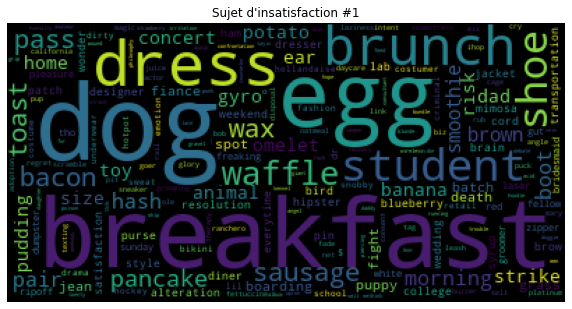

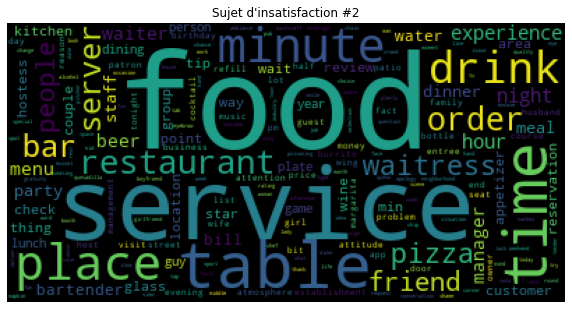

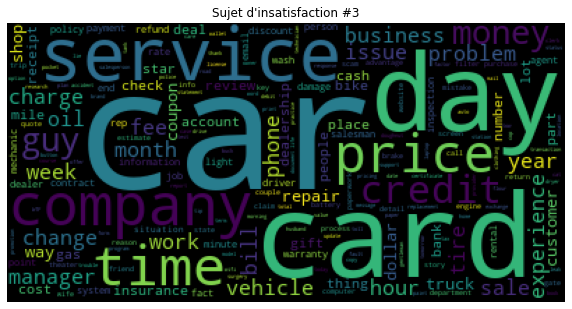

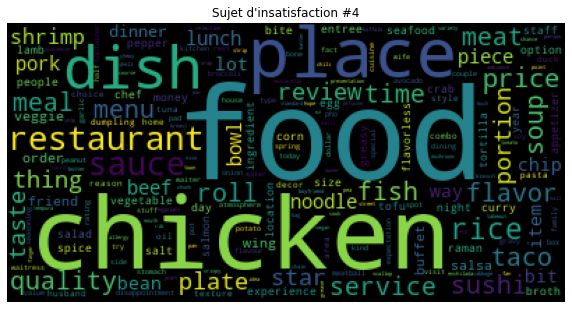

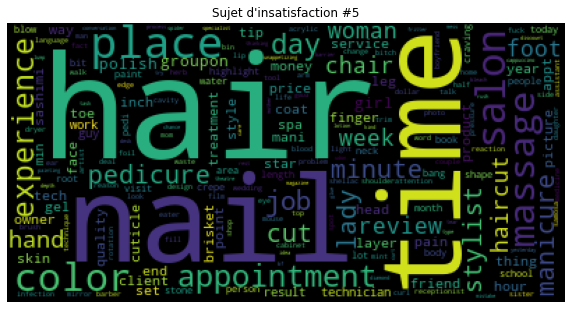

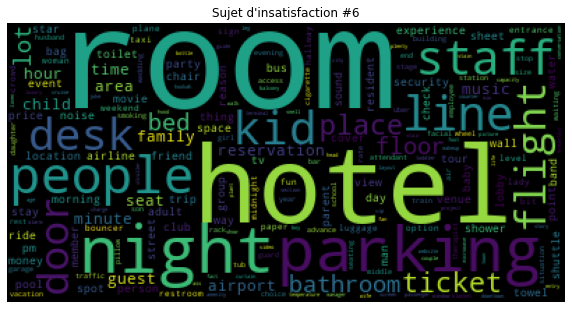

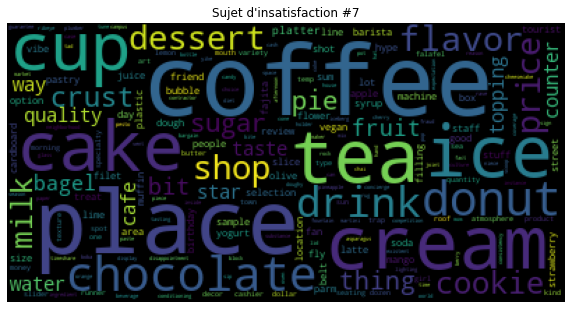

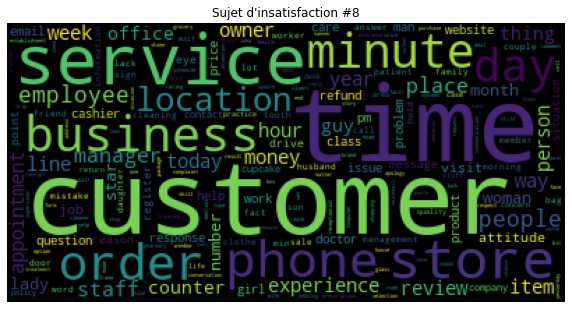

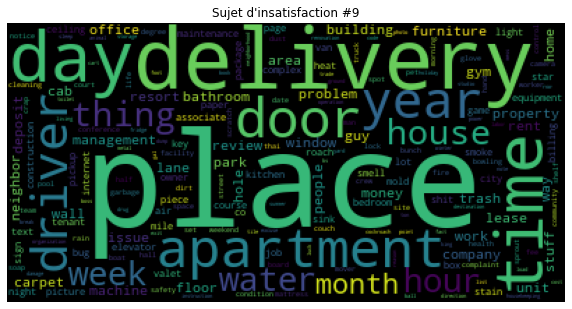

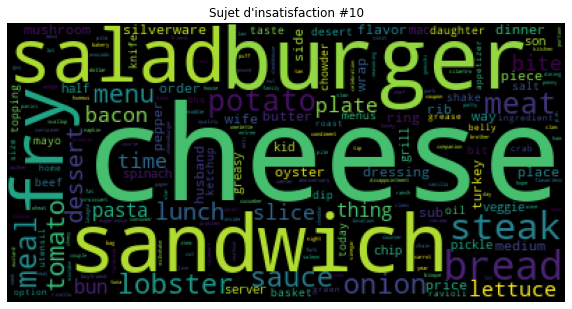

In [31]:
visualization_wordcloud(model_lda_bow)

### Utilisation de PyLDAvis pour la visualisation des sujets d'insatisfaction
- PyLDAvis est une bibliothèque spécialisée pour la visualisation interactive des résultats d'un modèle LDA
- Elle permet :
    - Une meilleure compréhension et interprétation des topics de façon individuelle
    - Une meilleure compréhension des relations entre les topics

In [32]:
def visualization_pyldavis(model, corpus, dictionary):
    print("Visualisation des sujets d'insatisfaction avec PyLDAvis :")
    pyldavis = gensimvis.prepare(model, corpus, dictionary)
    return pyldavis

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [33]:
visualization_pyldavis(model_lda_bow, bow_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Visualisation des sujets d'insatisfaction avec PyLDAvis :


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.125026  0.074371       1        1  22.273052
7      0.160652 -0.084982       2        1  16.455318
3     -0.007168  0.246873       3        1  14.837962
2      0.126409 -0.141536       4        1  10.516792
8      0.082820 -0.123625       5        1   7.977547
5      0.067121 -0.093431       6        1   7.713816
9     -0.106062  0.267133       7        1   7.005381
6     -0.059431  0.104272       8        1   5.761614
4      0.070562 -0.074463       9        1   5.382086
0     -0.459927 -0.174612      10        1   2.076431, topic_info=          Term          Freq         Total Category  logprob  loglift
24        food  62085.000000  62085.000000  Default  30.0000  30.0000
965        car  15033.000000  15033.000000  Default  29.0000  29.0000
8         room  12644.000000  12644.000000  Default  28.0000  28.0000
71       table  20345.000000  20345.000000  Default  27.0000  27.0000
61    customer  21433.000000  21433.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
1338    animal    347.607393    590.017113  Topic10  -4.9967   3.3454
1586       ear    320.829216    568.594131  Topic10  -5.0768   3.3023
215    morning    489.389595   3284.507406  Topic10  -4.6546   1.9707
181     potato    335.103306   3064.584697  Topic10  -5.0333   1.6613
670       home    333.568661   4284.880561  Topic10  -5.0379   1.3215

[618 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1900      6  0.998626   access
646       2  0.142248  account
646       4  0.857312  account
3723      9  0.998096  acrylic
1336      6  0.931007    adult
...     ...       ...      ...
134       6  0.031750     year
134       7  0.019333     year
134       8  0.000667     year
134       9  0.061334     year
1012      8  0.999043   yogurt

[1039 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 8, 4, 3, 9, 6, 10, 7, 5, 1])

#### Modèle LDA avec Bag-Of-Words - 10 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service / emplacement**
- Sujet d'insatisfaction 2 : **reservation**
- Sujet d'insatisfaction 3 : **restaurant : nourriture / déjeuner**
- Sujet d'insatisfaction 4 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 5 : **parking**
- Sujet d'insatisfaction 6 : **hotel**
- Sujet d'insatisfaction 7 : **sandwicherie / fast-food**
- Sujet d'insatisfaction 8 : **salon de thé / gouter**
- Sujet d'insatisfaction 9 : **salon de beauté / massage / coiffure**
- Sujet d'insatisfaction 10 : **petit-déjeuner / brunch**

#### Conclusion :
- Le score de cohérence est bon
- Les sujets d'insatisfaction des clients sont clairement identifiables et interprétables d'un point de vue métier
- Il y a un peu d'overlap sur certains topics

### Modélisation avec 5 sujets d'insatisfaction clients (5 topics)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.037*"room" + 0.022*"place" + 0.018*"hotel" + 0.014*"night" + 0.014*"people" + 0.012*"parking" + 0.011*"staff" + 0.011*"door"
Topic: 1 
Words: 0.061*"food" + 0.035*"service" + 0.033*"time" + 0.030*"table" + 0.029*"place" + 0.026*"minute" + 0.026*"order" + 0.022*"drink"
Topic: 2 
Words: 0.027*"time" + 0.023*"service" + 0.022*"car" + 0.021*"customer" + 0.017*"day" + 0.012*"phone" + 0.012*"store" + 0.011*"business"
Topic: 3 
Words: 0.033*"food" + 0.025*"place" + 0.021*"chicken" + 0.014*"sauce" + 0.012*"dish" + 0.012*"cheese" + 0.011*"restaurant" + 0.011*"flavor"
Topic: 4 
Words: 0.035*"hair" + 0.031*"time" + 0.024*"nail" + 0.020*"place" + 0.015*"appointment" + 0.013*"experience" + 0.012*"salon" + 0.011*"minute"

Evaluation du modèle :
Score de Perplexité = -6.920
Score de Cohérence = 0.633

Visualisation :
Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


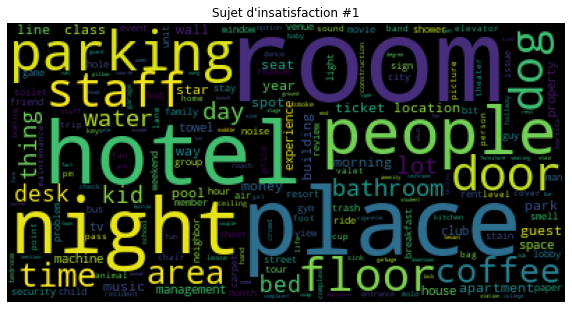

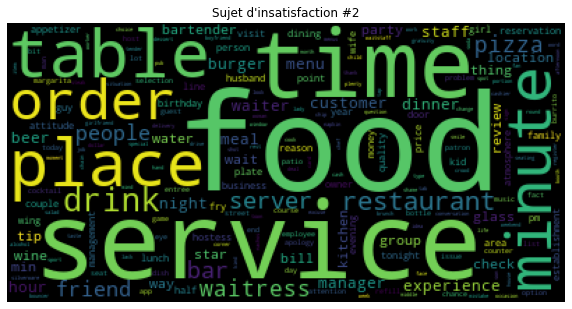

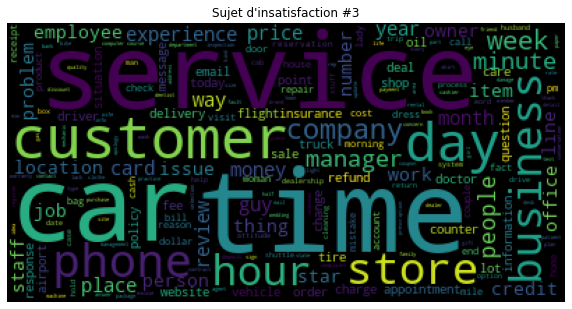

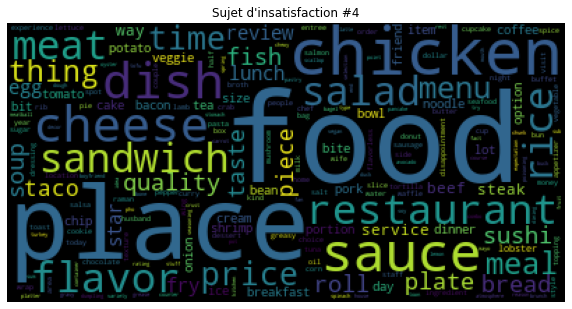

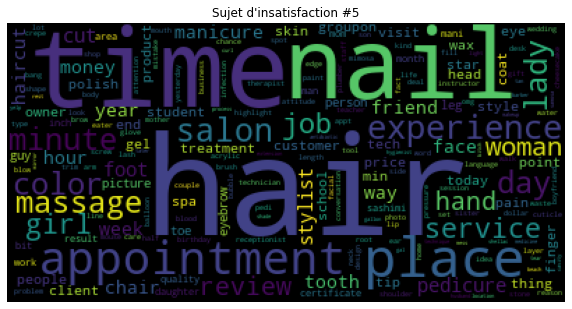

Visualisation des sujets d'insatisfaction avec PyLDAvis :


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.072683  0.028342       1        1  27.516202
2      0.123246  0.047625       2        1  26.667976
3     -0.286817  0.019059       3        1  24.495992
0      0.088856 -0.267559       4        1  13.607783
4      0.147398  0.172533       5        1   7.712046, topic_info=      Term          Freq         Total Category  logprob  loglift
24    food  61498.000000  61498.000000  Default  30.0000  30.0000
71   table  20161.000000  20161.000000  Default  29.0000  29.0000
8     room  12490.000000  12490.000000  Default  28.0000  28.0000
226  drink  15053.000000  15053.000000  Default  27.0000  27.0000
965    car  14577.000000  14577.000000  Default  26.0000  26.0000
..     ...           ...           ...      ...      ...      ...
303   week   1172.116164   8818.232671   Topic5  -5.0933   0.5444
134   year   1179.196812  11812.530104   Topic5  -5.0873   0.2581
251  money   1139.824005  11013.949207   Topic5  -5.1212   0.2941
63    hour   1113.661428  16555.850953   Topic5  -5.1444  -0.1367
223    way   1044.528986  14586.665750   Topic5  -5.2085  -0.0742

[322 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
646       2  0.999401    account
1172      2  0.999274    airport
1338      4  0.998776     animal
535       2  0.078007  apartment
535       4  0.921859  apartment
...     ...       ...        ...
134       1  0.201989       year
134       2  0.425142       year
134       3  0.120719       year
134       4  0.152296       year
134       5  0.099809       year

[482 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 4, 1, 5])

In [34]:
# Modélisation
model_lda_bow_5t = model_lda(5, bow_corpus, dictionary)

# Evaluation du modèle
print("\nEvaluation du modèle :")
perplexity_score = compute_perplexity_score(model_lda_bow_5t, bow_corpus)
print('Score de Perplexité = %.3f' % (perplexity_score))
coherence_score = compute_coherence_score(model_lda_bow_5t, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

# Visualisation du modèle
print("\nVisualisation :")
visualization_wordcloud(model_lda_bow_5t)
visualization_pyldavis(model_lda_bow_5t, bow_corpus, dictionary)

#### Modèle LDA avec Bag-Of-Words - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service / emplacement**
- Sujet d'insatisfaction 2 : **reservation / voiture**
- Sujet d'insatisfaction 3 : **restaurant : nourriture / emplacement**
- Sujet d'insatisfaction 4 : **hotel**
- Sujet d'insatisfaction 5 : **salon de beauté / massage / coiffure**

#### Conclusion : 
- Le score de cohérence est bon
- Les sujets d'insatisfaction sont clairement identifiables et interprétables d'un point de vue métier
- Il n'y a pas d'overlap entre les sujets d'insatisfaction

### Sélection du nombre optimal de sujets d'insatisfaction

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [35]:
def compute_coherence_perplexity_scores_ldamodel(start, stop, step, corpus, dictionary, documents):
    coherence_scores=[]
    perplexity_scores=[]
    for num_topics in range(start, stop+1, step):
        
        print(f"\nCalcul pour {num_topics} topics :")
        model_lda = LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary, passes=2, random_state=0)
        
        perplexity_score = model_lda.log_perplexity(corpus)
        perplexity_scores.append(perplexity_score)
        print('Score de Perplexité = %.3f' % (perplexity_score))
        
        coherence_model = CoherenceModel(model=model_lda, texts=documents, dictionary=dictionary, coherence='c_v')
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)
        print('Score de Cohérence = %.3f' % (coherence_score))
        
    return coherence_scores, perplexity_scores

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Nous calculons les scores pour des nombres de sujets d'insatisfaction compris entre 3 et 12 :
- 3 nous semble être le nombe de sujets minimal d'un point de vue métier : en dessous ce n'est pas assez granulaire (précis) pour être utilisé d'un point de vue métier
- 12 nous semble être le nomtre de sujets maximal d'un point de vue métier : au dessus il y aurait trop de sujets pour être exploité d'un point de vue métier

In [36]:
min_topics=3
max_topics=12

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [37]:
coherence_scores, perplexity_scores = compute_coherence_perplexity_scores_ldamodel(min_topics, max_topics, 1, bow_corpus, dictionary, list_neg_reviews)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Calcul pour 3 topics :
Score de Perplexité = -6.930
Score de Cohérence = 0.585

Calcul pour 4 topics :
Score de Perplexité = -6.918
Score de Cohérence = 0.614

Calcul pour 5 topics :
Score de Perplexité = -6.934
Score de Cohérence = 0.629

Calcul pour 6 topics :
Score de Perplexité = -6.985
Score de Cohérence = 0.613

Calcul pour 7 topics :
Score de Perplexité = -7.029
Score de Cohérence = 0.576

Calcul pour 8 topics :
Score de Perplexité = -7.076
Score de Cohérence = 0.600

Calcul pour 9 topics :
Score de Perplexité = -7.138
Score de Cohérence = 0.585

Calcul pour 10 topics :
Score de Perplexité = -7.247
Score de Cohérence = 0.619

Calcul pour 11 topics :
Score de Perplexité = -7.396
Score de Cohérence = 0.609

Calcul pour 12 topics :
Score de Perplexité = -7.562
Score de Cohérence = 0.584


In [38]:
x=[int(i) for i in range(min_topics, max_topics+1)]

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


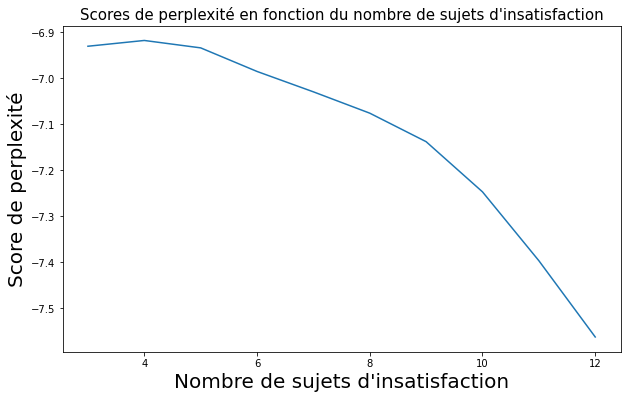

In [39]:
plt.figure(figsize=(10,6))
plt.plot(x, perplexity_scores)
plt.title("Scores de perplexité en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de perplexité", fontsize=20)
plt.show()

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


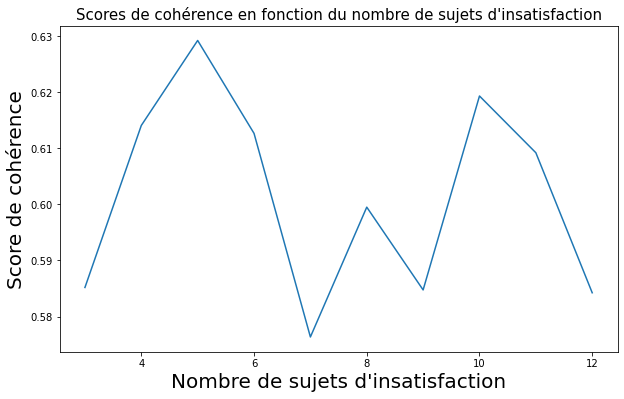

In [40]:
plt.figure(figsize=(10,6))
plt.plot(x, coherence_scores)
plt.title("Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

#### Conclusion :
- Le score de perplexité est continuement décroissant
- Le score de cohérence est maximal pour 5 et 10 sujets d'instisfaction
- Cela correspond au nombre de sujets d'insatisfaction que nous avons étudiés
- Le choix entre les deux doit se faire avec les personnes du métier :
    - 5 sujets d'insatisfaction : sujets bien scindés
    - 10 sujets d'insatisfaction : sujets plus précis

### Représentation TF-IDF
- On compte le nombre d'apparitions du mot dans le document (TF : Term Frequency)
- On pondére par l'inverse du nombre d'apparitions du mot dans l'ensemble des documents (IDF : Inverse Term Frequency)
> Par rapport à une représentation Bag-Of-Words, cela permet de donner plus d'importance aux mots qui apparaissent fréquemment dans un document mais peu fréquemment dans les autres documents, ce qui signifie que le mot a de l'importance dans ce document en particulier. 

In [41]:
def create_tfidf_corpus(bow_corpus):
    # On crée le corpus TF-IDF
    tfidf = TfidfModel(bow_corpus, smartirs='ntc')
    tfidf_corpus = tfidf[bow_corpus]
    print("Création du Corpus TF-IDF : OK")
    return tfidf_corpus

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [42]:
tfidf_corpus = create_tfidf_corpus(bow_corpus)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Création du Corpus TF-IDF : OK


#### Remarque :
- Nous avons étudié le modèle LDA avec une représentation Bag-Of-Words et une représentation TF-IDF
- Etant donné que le modèle LDA est un modèle probabiliste, la représentation Bag-Of-Words est plus adaptée que la représentation TF-IDF

### Modèle LDA avec TF-IDF

#### Création d'une fonction 'pipeline' :
- Nous créons une fonction 'pipeline' regroupant les fonctions de nettoyage, preprocessing et modélisation
- Cela permet d'automatiser le processus

In [43]:
def pipeline_model_lda_tfidf(df_neg_reviews, num_topics):
    # Nettoyage des données
    df_neg_reviews_clean = clean_data(df_neg_reviews)

    # PreProcessing des données
    df_neg_reviews_preprocessed = preprocess_data(df_neg_reviews_clean, preprocessing)

    # Création du dictionnaire et de la liste des critiques
    dictionary, list_neg_reviews = create_dictionary(df_neg_reviews_preprocessed)

    # Création du corpus
    bow_corpus = create_bow_corpus(dictionary, list_neg_reviews)
    tfidf_corpus = create_tfidf_corpus(bow_corpus)

    # Modélisation
    model_lda_tfidf = model_lda(num_topics, tfidf_corpus, dictionary)
    
    return model_lda_tfidf

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Sélection du nombre optimal de sujets d'insatisfaction

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [44]:
min_topics=3
max_topics=12

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [45]:
coherence_scores, perplexity_scores = compute_coherence_perplexity_scores_ldamodel(min_topics, max_topics, 1, tfidf_corpus, dictionary, list_neg_reviews)


Calcul pour 3 topics :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Perplexité = -8.352
Score de Cohérence = 0.617

Calcul pour 4 topics :
Score de Perplexité = -8.500
Score de Cohérence = 0.565

Calcul pour 5 topics :
Score de Perplexité = -8.657
Score de Cohérence = 0.609

Calcul pour 6 topics :
Score de Perplexité = -8.825
Score de Cohérence = 0.575

Calcul pour 7 topics :
Score de Perplexité = -9.018
Score de Cohérence = 0.614

Calcul pour 8 topics :
Score de Perplexité = -9.240
Score de Cohérence = 0.592

Calcul pour 9 topics :
Score de Perplexité = -9.448
Score de Cohérence = 0.479

Calcul pour 10 topics :
Score de Perplexité = -9.695
Score de Cohérence = 0.497

Calcul pour 11 topics :
Score de Perplexité = -10.039
Score de Cohérence = 0.483

Calcul pour 12 topics :
Score de Perplexité = -10.383
Score de Cohérence = 0.498


In [46]:
x=[int(i) for i in range(min_topics, max_topics+1)]

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


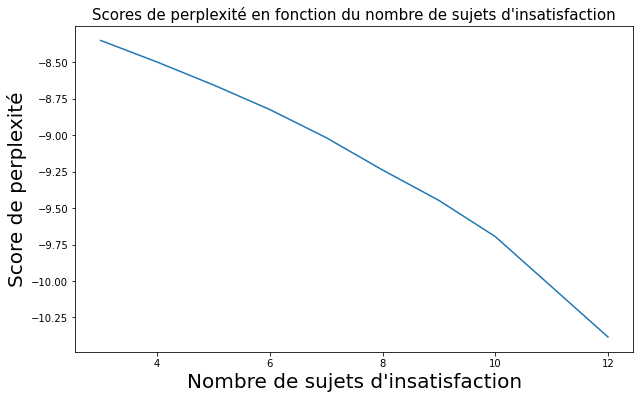

In [47]:
plt.figure(figsize=(10,6))
plt.plot(x, perplexity_scores)
plt.title("Scores de perplexité en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de perplexité", fontsize=20)
plt.show()

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


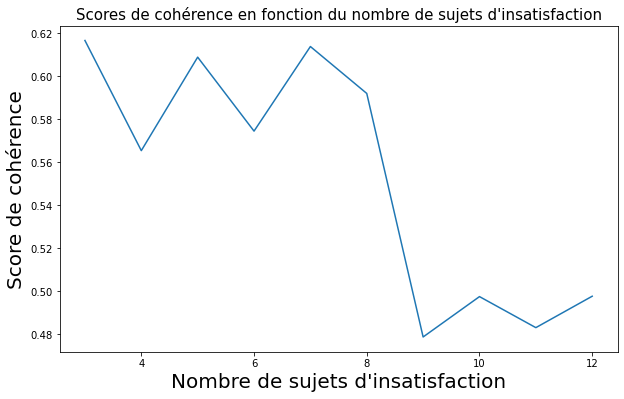

In [48]:
plt.figure(figsize=(10,6))
plt.plot(x, coherence_scores)
plt.title("Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

#### Conclusion :
- Le score de cohérence est maximal pour 3 et 7 sujets d'insatisafaction ensuite il décroit
- Le score de perplexité est nettement meilleur pour 7 sujets d'insatisfaction que pour 3
> **Nous allons faire la modélisation avec 7 sujets d'insatisfaction**

In [49]:
model_lda_tfidf_7t = pipeline_model_lda_tfidf(df_neg_reviews, 7)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Nettoyage des données : OK
PreProcessing des données : OK
Création du dictionnaire : OK
Création du Corpus Bag of Words : OK
Création du Corpus TF-IDF : OK
Modélisation LDA : OK

Affichage des Topics : 
Topic: 0 
Words: 0.014*"poisoning" + 0.014*"bagel" + 0.009*"eyebrow" + 0.008*"vibe" + 0.007*"yogurt" + 0.007*"mold" + 0.006*"support" + 0.005*"clothing"
Topic: 1 
Words: 0.007*"movie" + 0.006*"venue" + 0.006*"student" + 0.005*"music" + 0.005*"deposit" + 0.005*"bouncer" + 0.005*"theater" + 0.004*"wax"
Topic: 2 
Words: 0.012*"car" + 0.010*"customer" + 0.008*"time" + 0.008*"day" + 0.007*"service" + 0.007*"store" + 0.007*"phone" + 0.007*"hour"
Topic: 3 
Words: 0.015*"chicken" + 0.012*"pizza" + 0.012*"food" + 0.010*"sauce" + 0.010*"rice" + 0.008*"flavor" + 0.008*"cheese" + 0.008*"place"
Topic: 4 
Words: 0.030*"nail" + 0.030*"hair" + 0.015*"salon" + 0.014*"massage" + 0.012*"pedicure" + 0.010*"manicure" + 0.009*"stylist" + 0.009*"color"
Topic: 5 
Words: 0.027*"room" + 0.025*"hotel" + 0.009*"be

### Visualisation des sujets d'insatisfaction client

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


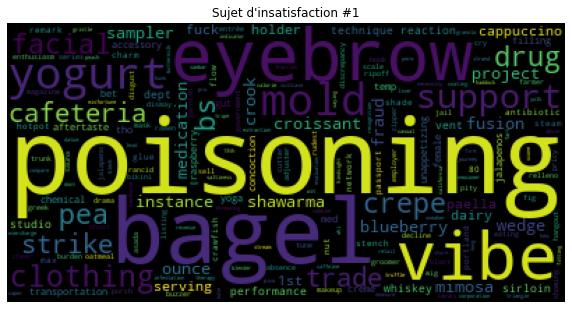

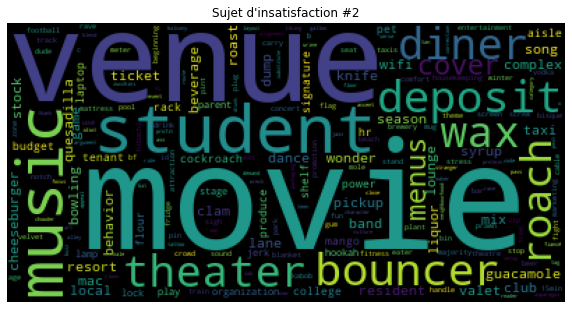

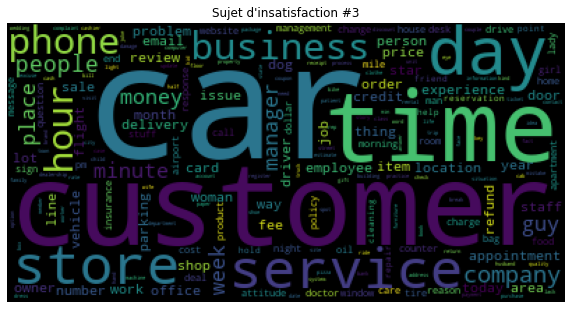

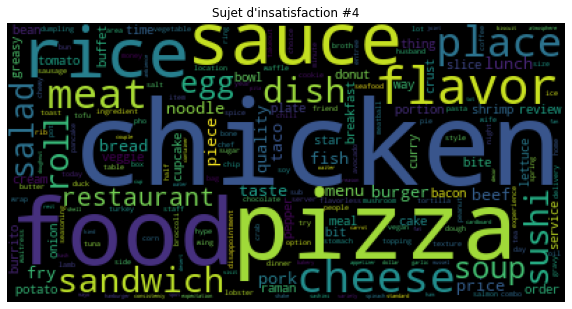

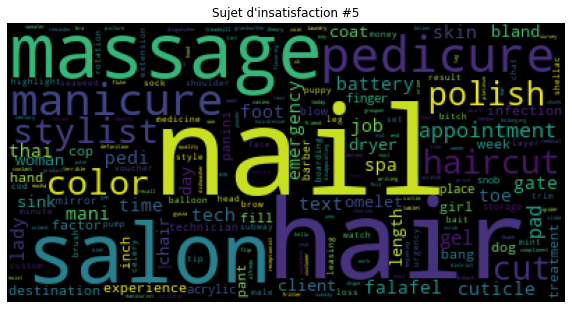

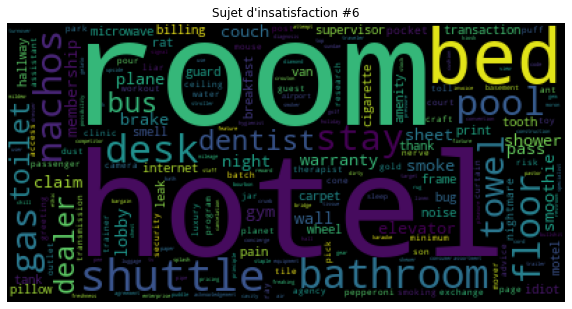

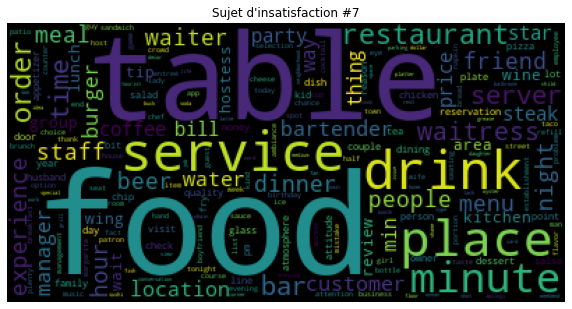

In [50]:
visualization_wordcloud(model_lda_tfidf_7t)

In [51]:
visualization_pyldavis(model_lda_tfidf_7t, tfidf_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Visualisation des sujets d'insatisfaction avec PyLDAvis :


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.265281  0.041047       1        1  27.917692
2     -0.219480 -0.039063       2        1  26.972800
3     -0.223440  0.050811       3        1  18.700878
1      0.203408  0.181120       4        1   7.810522
5      0.190715  0.103812       5        1   7.294710
4      0.090736 -0.244769       6        1   6.608683
0      0.223342 -0.092958       7        1   4.694715, topic_info=            Term         Freq        Total Category  logprob  loglift
8           room  1056.000000  1056.000000  Default  30.0000  30.0000
140         hair   825.000000   825.000000  Default  29.0000  29.0000
548         nail   703.000000   703.000000  Default  28.0000  28.0000
4          hotel   733.000000   733.000000  Default  27.0000  27.0000
24          food  2878.000000  2878.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
1376         1st    52.871530    53.730713   Topic7  -5.7398   3.0426
1474       dairy    52.360356    53.216745   Topic7  -5.7495   3.0425
448         vibe   124.312568   172.487682   Topic7  -4.8849   2.7312
459    cafeteria    75.279205    94.121100   Topic7  -5.3865   2.8354
352   medication    54.437069    63.272193   Topic7  -5.7106   2.9083

[425 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1376      7  0.986400      1st
646       1  0.056262  account
646       2  0.939571  account
3723      6  0.981448  acrylic
929       2  0.988494  address
...     ...       ...      ...
134       1  0.335325     year
134       2  0.504083     year
134       3  0.127117     year
134       6  0.033971     year
1012      7  0.992822   yogurt

[667 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 3, 4, 2, 6, 5, 1])

#### Modèle LDA avec TF-IDF - 7 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : service / emplacement**
- Sujet d'insatisfaction 2 : **réservation / voiture**
- Sujet d'insatisfaction 3 : **restaurant : nourriture**
- Sujet d'insatisfaction 4 : **activités de divertissement : cinéma / musique / théatre**
- Sujet d'insatisfaction 5 : **hotel**
- Sujet d'insatisfaction 6 : **salon de beauté / massage / coiffure**
- Sujet d'insatisfaction 7 : **difficilement interprétable**

#### Conclusion : 
- Le score de cohérence est bon
- Les sujets d'insatisfaction sont globalement cohérents avec ceux du modèle précédent (LDA avec BagOfWords)
- Les sujets d'insatisfaction sont un peu moins clairement identifiables et interprétables, notamment le sujet 7
- Il y a un nouveau sujet d'insatisfaction qui n'avait pas été découvert par le modèle récédent : le sujet 4

### Modélisation NMF : Non negative Matrix Factorization
- Le modèle NMF est une méthode d'algèbre linéaire basée sur la décomposition de matrices qui permet d'extraire des composantes latentes (cachées) d'un jeu de données (les topics)
- C'est un cas particulier de décomposition de matrice en valeurs singulières (SVD Single Value Decomposition) pour lequel les termes de la matrice sont non négatifs
- Cet algorithme est donc particulièrement adapté au problème de traitement du langage naturel puisque les occurrences de mots sont non négatives
- La non-négativité des termes entraîne des propriétés d'interprétabilité intéressantes
- L'algorithme permet d'extraire les composantes latentes du texte : pour cela la matrice 'document-term' est décomposée en une matrice 'document-topic' et une matrice 'topic-term', ce qui permet d'extraire les topics

### Modèle NMF avec Bag-Of-Words

In [52]:
def model_nmf(num_topics, corpus, dictionary):
    # modélisation
    model_nmf = Nmf(corpus=corpus,
                    num_topics=num_topics,
                    id2word=dictionary,
                    random_state=0)
    print("Modélisation NMF : OK")

    # affichage des topics
    print("\nAffichage des Topics : ")
    for idx, topic in model_nmf.print_topics(num_topics=-1, num_words=8):
        print("Topic: {} \nWords: {}".format(idx, topic))
        #print("\n")

    return model_nmf

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Modélisation avec 10 sujets d'insatisfaction clients (10 topics)

In [53]:
model_nmf_bow_10t = model_nmf(10, bow_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.171*"time" + 0.026*"day" + 0.013*"year" + 0.012*"week" + 0.011*"month" + 0.010*"people" + 0.009*"thing" + 0.008*"money"
Topic: 1 
Words: 0.135*"order" + 0.047*"minute" + 0.024*"time" + 0.023*"burger" + 0.021*"pizza" + 0.017*"chicken" + 0.015*"fry" + 0.015*"menu"
Topic: 2 
Words: 0.043*"customer" + 0.026*"store" + 0.019*"hour" + 0.017*"manager" + 0.016*"phone" + 0.014*"business" + 0.013*"way" + 0.013*"minute"
Topic: 3 
Words: 0.086*"room" + 0.044*"hotel" + 0.024*"night" + 0.021*"day" + 0.016*"manager" + 0.016*"staff" + 0.016*"desk" + 0.012*"bed"
Topic: 4 
Words: 0.096*"hair" + 0.045*"pizza" + 0.023*"room" + 0.023*"nail" + 0.019*"salon" + 0.019*"stylist" + 0.013*"appointment" + 0.013*"experience"
Topic: 5 
Words: 0.185*"service" + 0.066*"restaurant" + 0.030*"customer" + 0.022*"server" + 0.013*"food" + 0.013*"meal" + 0.012*"experience" + 0.011*"dish"
Topic: 6 
Words: 0.091*"table" + 0.048*"minute" + 0.043*"drink" + 0.030*"b

### Evaluation du modèle

#### Score de cohérence

In [54]:
coherence_score = compute_coherence_score(model_nmf_bow_10t, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Cohérence = 0.629


### Visualisation des sujets d'insatisfaction sous forme de WordCloud

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


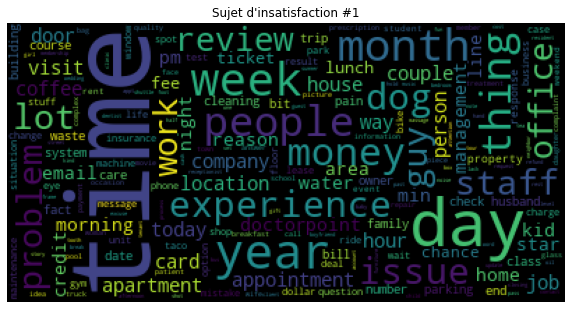

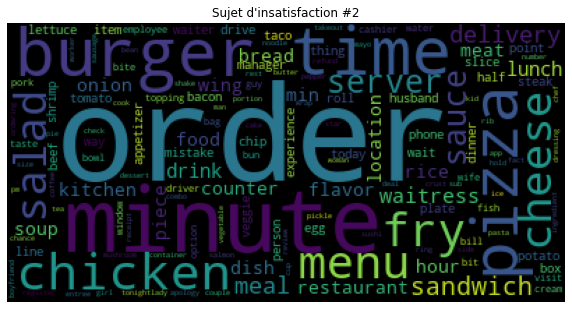

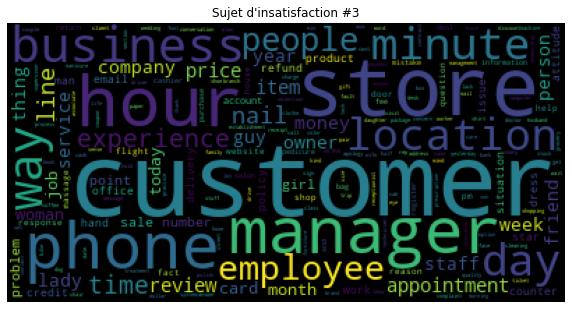

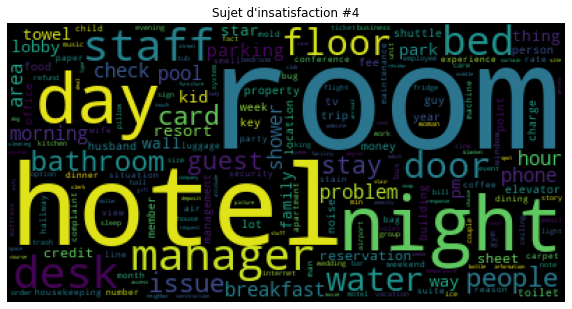

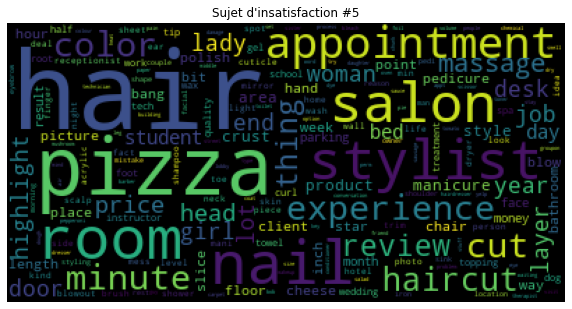

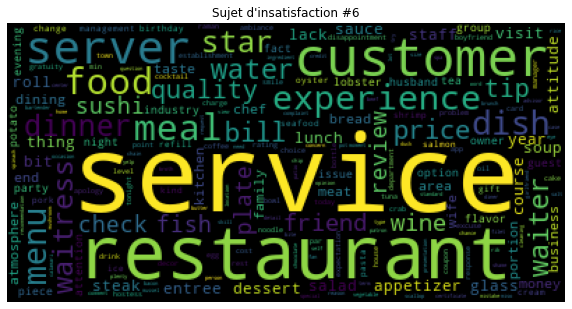

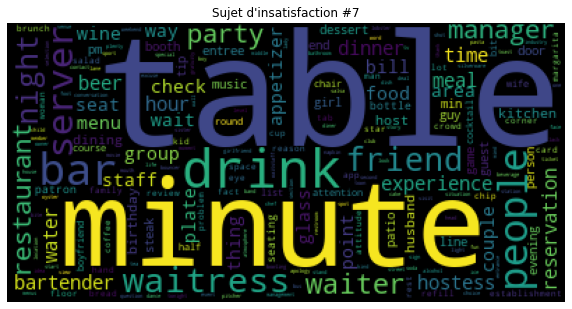

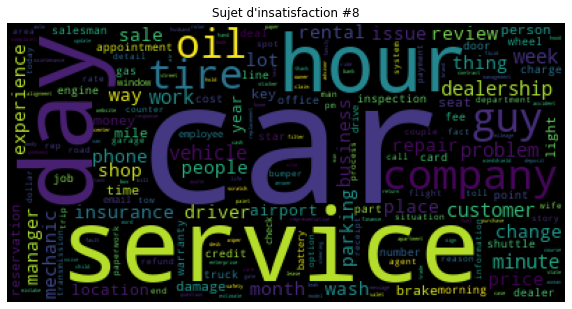

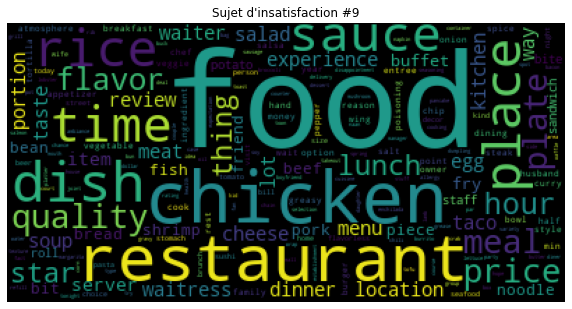

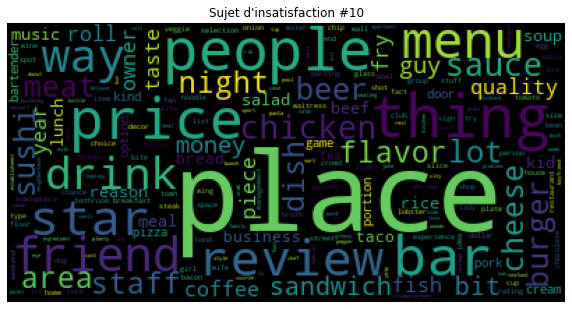

In [55]:
visualization_wordcloud(model_nmf_bow_10t)

#### Modèle NMF avec Bag-Of-Words - 10 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **reservation**
- Sujet d'insatisfaction 2 : **restaurant : commande / menu**
- Sujet d'insatisfaction 3 : **reservation**
- Sujet d'insatisfaction 4 : **hotel : chambres**
- Sujet d'insatisfaction 5 : **salon de beauté / coiffure**
- Sujet d'insatisfaction 6 : **restaurant : service**
- Sujet d'insatisfaction 7 : **emplacement / bar / boisson**
- Sujet d'insatisfaction 8 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 9 : **restaurant : nourriture / déjeuner**
- Sujet d'insatisfaction 10 : **emplacement / bar / boisson**

#### Conclusion : 
- Le score de cohérence est bon
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier
- Ils semblent cependant l'être un peu moins que pour le modèle LDA :
    - certains sujets d'insatisfaction ne sont pas très clairs
    - certains sujets d'insatisfaction sont similaires (topics 1 et 3 / topics 7 et 10)
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle LDA
    - On peut noter le sujet d'insatisfaction bar / boisson qui ressort plus que pour le modèle LDA
    
> Ce modèle semble moins bon que les précédents basés sur une analyse LDA

### Modélisation avec 5 sujets d'insatisfaction clients (5 topics)

In [56]:
model_nmf_bow_5t = model_nmf(5, bow_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.102*"food" + 0.029*"restaurant" + 0.028*"table" + 0.022*"service" + 0.019*"order" + 0.019*"minute" + 0.016*"server" + 0.015*"drink"
Topic: 1 
Words: 0.054*"room" + 0.025*"hotel" + 0.020*"day" + 0.015*"night" + 0.011*"people" + 0.010*"desk" + 0.010*"hair" + 0.009*"staff"
Topic: 2 
Words: 0.058*"service" + 0.054*"car" + 0.036*"customer" + 0.017*"day" + 0.012*"minute" + 0.011*"manager" + 0.010*"hour" + 0.009*"phone"
Topic: 3 
Words: 0.135*"time" + 0.026*"order" + 0.024*"minute" + 0.016*"hour" + 0.010*"day" + 0.009*"people" + 0.009*"experience" + 0.008*"year"
Topic: 4 
Words: 0.112*"place" + 0.013*"people" + 0.011*"bar" + 0.011*"pizza" + 0.010*"thing" + 0.009*"chicken" + 0.009*"drink" + 0.008*"price"


### Evaluation du modèle

#### Score de cohérence

In [57]:
coherence_score = compute_coherence_score(model_nmf_bow_5t, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Cohérence = 0.597


### Visualisation des sujets d'insatisfaction sous forme de WordCloud

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


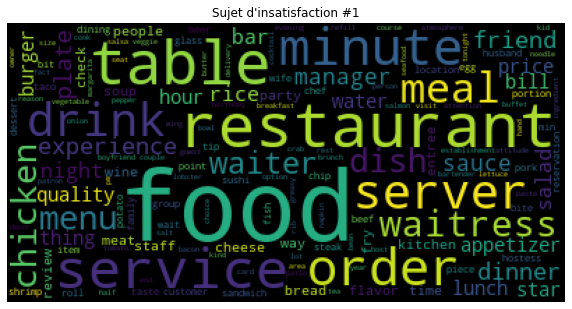

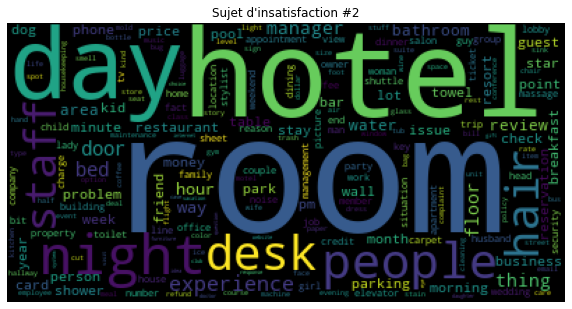

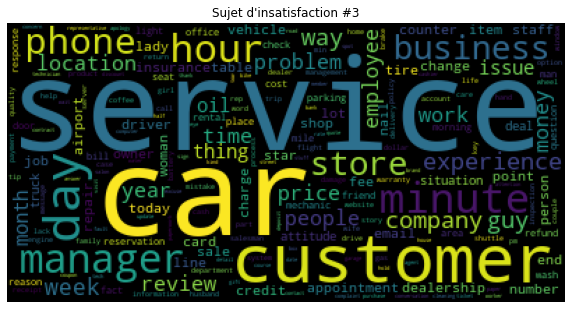

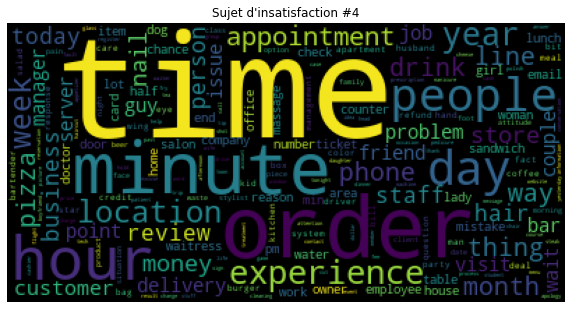

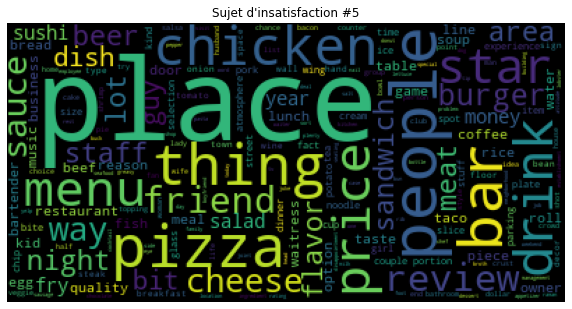

In [58]:
visualization_wordcloud(model_nmf_bow_5t)

#### Modèle NMF avec Bag-Of-Words - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : nourriture / service / emplacement**
- Sujet d'insatisfaction 2 : **hotel : chambres**
- Sujet d'insatisfaction 3 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 4 : **réservation**
- Sujet d'insatisfaction 5 : **emplacement / bar / boisson**

#### Conclusion : 
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier
- Ils semblent cependant l'être un peu moins que pour le modèle LDA :
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle LDA
    - On peut noter le sujet d'insatisfaction bar / boisson qui ressort plus que pour le modèle LDA

### Sélection du nombre optimal de sujets d'insatisfaction

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [59]:
def compute_coherence_scores_nmfmodel(start, stop, step, corpus, dictionary, documents):
    coherence_scores=[]
    for num_topics in range(start, stop+1, step):
        
        print(f"\nCalcul pour {num_topics} topics :")
        model_nmf = Nmf(corpus=corpus, num_topics=num_topics, id2word=dictionary, random_state=0)
        
        coherence_model = CoherenceModel(model=model_nmf, texts=documents, dictionary=dictionary, coherence='c_v')
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)
        print('Score de Cohérence = %.3f' % (coherence_score))
        
    return coherence_scores

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [60]:
min_topics=3
max_topics=12

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [61]:
coherence_scores = compute_coherence_scores_nmfmodel(min_topics, max_topics, 1, bow_corpus, dictionary, list_neg_reviews)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Calcul pour 3 topics :
Score de Cohérence = 0.610

Calcul pour 4 topics :
Score de Cohérence = 0.618

Calcul pour 5 topics :
Score de Cohérence = 0.597

Calcul pour 6 topics :
Score de Cohérence = 0.608

Calcul pour 7 topics :
Score de Cohérence = 0.611

Calcul pour 8 topics :
Score de Cohérence = 0.603

Calcul pour 9 topics :
Score de Cohérence = 0.595

Calcul pour 10 topics :
Score de Cohérence = 0.629

Calcul pour 11 topics :
Score de Cohérence = 0.577

Calcul pour 12 topics :
Score de Cohérence = 0.620


In [62]:
x=[int(i) for i in range(min_topics, max_topics+1)]

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


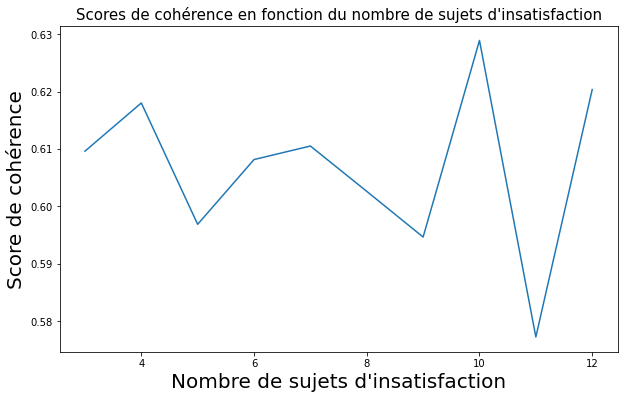

In [63]:
plt.figure(figsize=(10,6))
plt.plot(x, coherence_scores)
plt.title("Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

#### Conclusion :
- Le meilleur score de cohérence correspond à 10 sujets d'insatisfaction

### Modèle NMF avec TF-IDF

### Modélisation avec 10 sujets d'insatisfaction clients (10 topics)

In [64]:
model_nmf_tfidf_10t = model_nmf(10, tfidf_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.020*"coffee" + 0.016*"location" + 0.013*"store" + 0.008*"place" + 0.008*"people" + 0.008*"card" + 0.007*"taco" + 0.007*"time"
Topic: 1 
Words: 0.055*"order" + 0.017*"menu" + 0.015*"waitress" + 0.015*"dish" + 0.014*"soup" + 0.014*"minute" + 0.013*"roll" + 0.013*"salad"
Topic: 2 
Words: 0.129*"burger" + 0.048*"fry" + 0.012*"customer" + 0.012*"line" + 0.012*"cheese" + 0.011*"manager" + 0.010*"bun" + 0.010*"employee"
Topic: 3 
Words: 0.060*"room" + 0.040*"hotel" + 0.015*"staff" + 0.013*"desk" + 0.013*"bed" + 0.012*"night" + 0.009*"bathroom" + 0.008*"floor"
Topic: 4 
Words: 0.182*"pizza" + 0.022*"crust" + 0.019*"cheese" + 0.016*"nail" + 0.015*"slice" + 0.015*"delivery" + 0.012*"topping" + 0.009*"hair"
Topic: 5 
Words: 0.071*"restaurant" + 0.038*"service" + 0.036*"food" + 0.018*"waiter" + 0.016*"fish" + 0.013*"customer" + 0.012*"experience" + 0.012*"dish"
Topic: 6 
Words: 0.055*"table" + 0.039*"bar" + 0.034*"minute" + 0.019*"b

### Evaluation du modèle

#### Score de cohérence

In [65]:
coherence_score = compute_coherence_score(model_nmf_tfidf_10t, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Cohérence = 0.591


### Visualisation des sujets d'insatisfaction sous forme de WordCloud

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


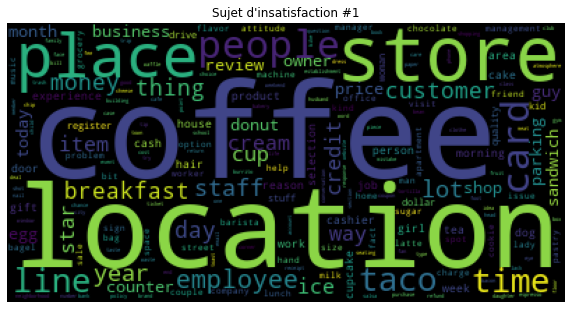

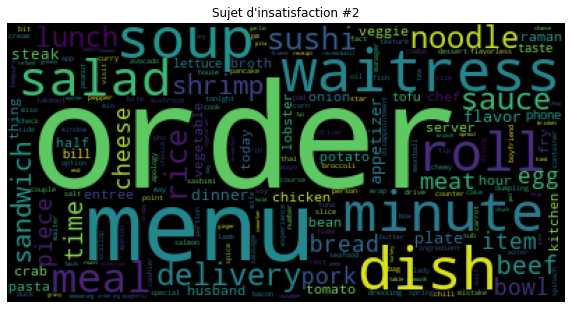

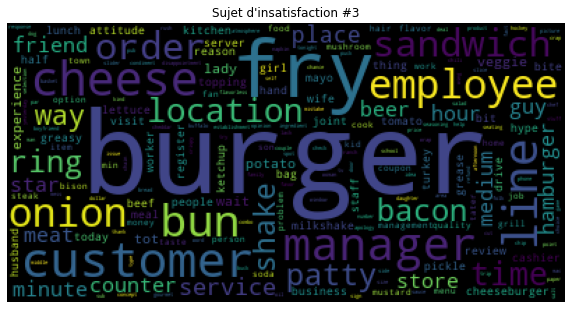

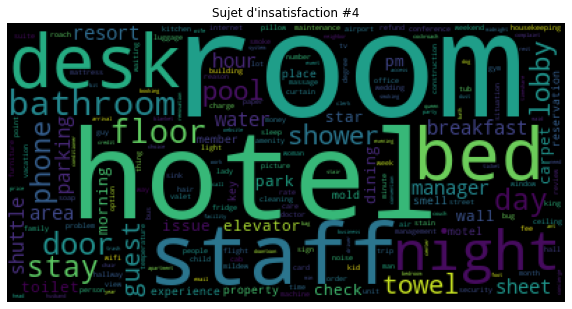

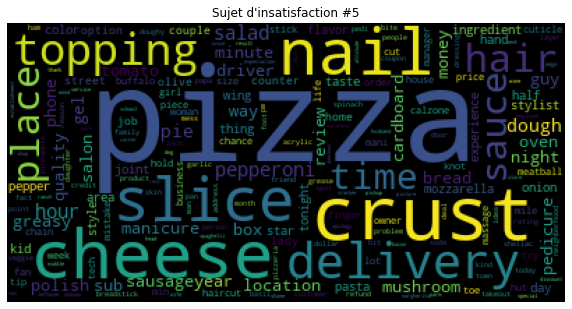

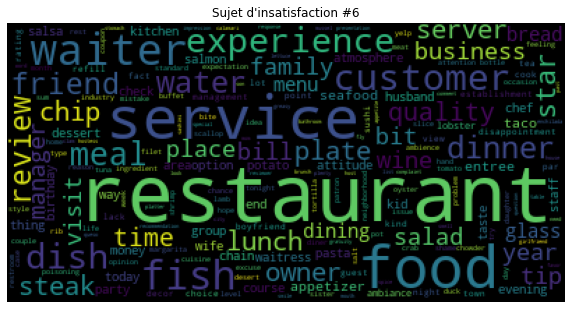

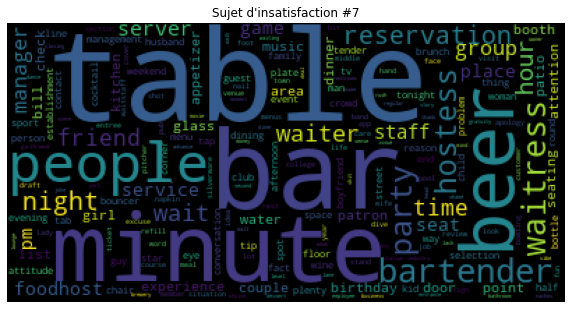

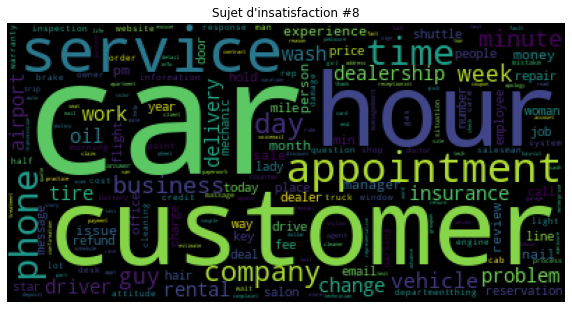

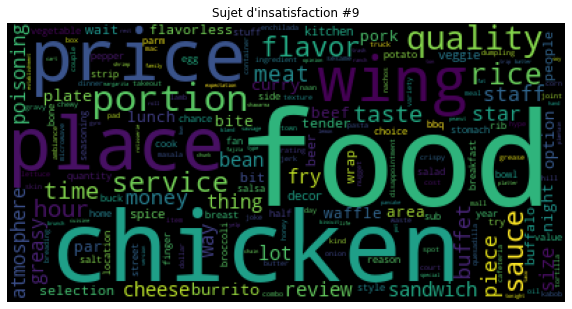

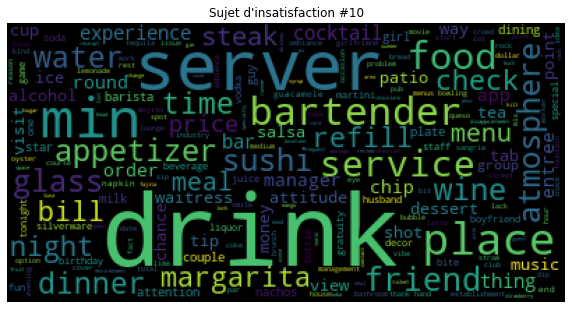

In [66]:
visualization_wordcloud(model_nmf_tfidf_10t)

#### Modèle NMF avec TF-IDF - 10 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **emplacement / café (pas très clair)**
- Sujet d'insatisfaction 2 : **restaurant : commande / menu**
- Sujet d'insatisfaction 3 : **sandwicherie / fast-food**
- Sujet d'insatisfaction 4 : **hotel : chambres**
- Sujet d'insatisfaction 5 : **restaurant : nourriture / livraison + salon de beauté / coiffure (mélange des deux topics)**
- Sujet d'insatisfaction 6 : **restaurant : service**
- Sujet d'insatisfaction 7 : **emplacement / bar / boisson (pas très clair)**
- Sujet d'insatisfaction 8 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 9 : **restaurant : nourriture / déjeuner**
- Sujet d'insatisfaction 10 : **boisson**

#### Conclusion : 
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA
- Les sujets d'insatisfaction sont globalement identifiables et interprétables d'un point de vue métier
- Ils le sont cependant moins que pour le modèle LDA :
    - certains sujets d'insatisfaction ne sont pas très clairs (topics 1 et 7)
    - certains sujets d'insatisfaction semblent mélangés (topic 5 mélangeant la restauration et la partie salon de beauté)
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle NMF avec Bag-Of-Words
    
> Ce modèle semble moins bon que les précédents basés sur une analyse LDA

### Modélisation avec 5 sujets d'insatisfaction clients (5 topics)

In [67]:
model_nmf_tfidf_5t = model_nmf(5, tfidf_corpus, dictionary)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Modélisation NMF : OK

Affichage des Topics : 
Topic: 0 
Words: 0.058*"food" + 0.026*"restaurant" + 0.025*"service" + 0.024*"table" + 0.021*"server" + 0.018*"order" + 0.016*"burger" + 0.015*"waitress"
Topic: 1 
Words: 0.018*"chicken" + 0.017*"sushi" + 0.013*"rice" + 0.012*"roll" + 0.012*"place" + 0.011*"price" + 0.010*"fish" + 0.009*"sauce"
Topic: 2 
Words: 0.016*"car" + 0.014*"customer" + 0.010*"service" + 0.009*"time" + 0.008*"day" + 0.008*"room" + 0.007*"minute" + 0.007*"hour"
Topic: 3 
Words: 0.051*"bar" + 0.039*"drink" + 0.026*"bartender" + 0.020*"beer" + 0.014*"order" + 0.012*"minute" + 0.011*"wing" + 0.011*"night"
Topic: 4 
Words: 0.131*"pizza" + 0.024*"cheese" + 0.023*"order" + 0.018*"delivery" + 0.016*"crust" + 0.014*"sandwich" + 0.012*"slice" + 0.012*"chicken"


### Evaluation du modèle

#### Score de cohérence

In [68]:
coherence_score = compute_coherence_score(model_nmf_tfidf_5t, list_neg_reviews, dictionary)
print('Score de Cohérence = %.3f' % (coherence_score))

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Score de Cohérence = 0.615


### Visualisation des sujets d'insatisfaction sous forme de WordCloud

Visualisation des sujets d'insatisfaction sous forme de nuages de mots :


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


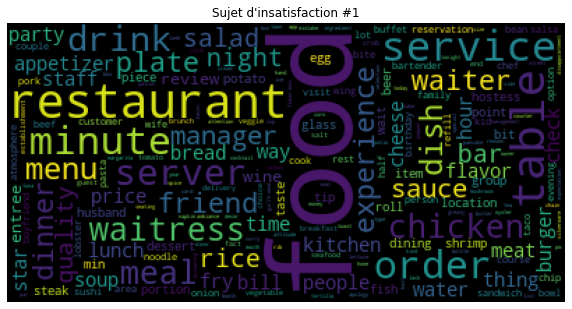

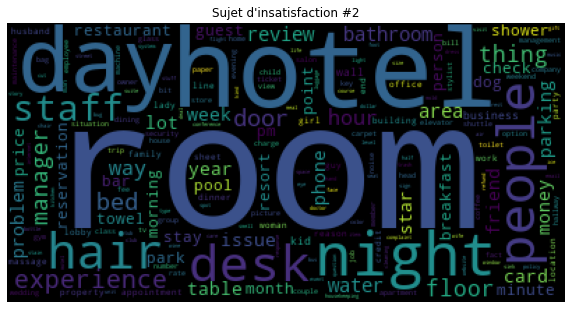

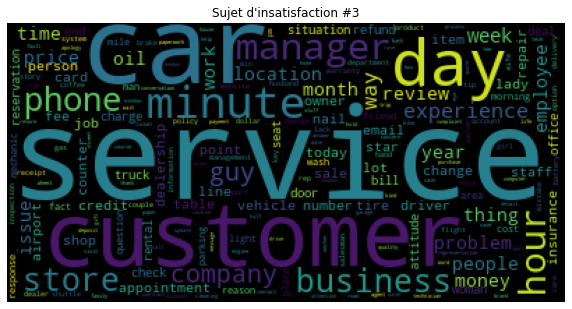

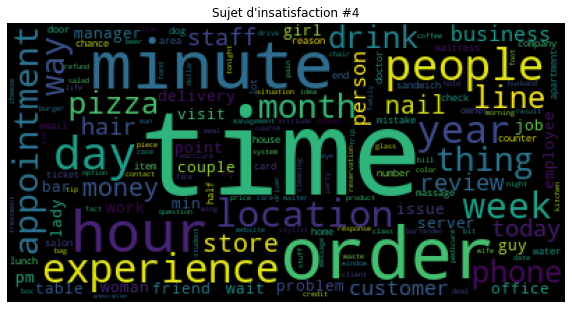

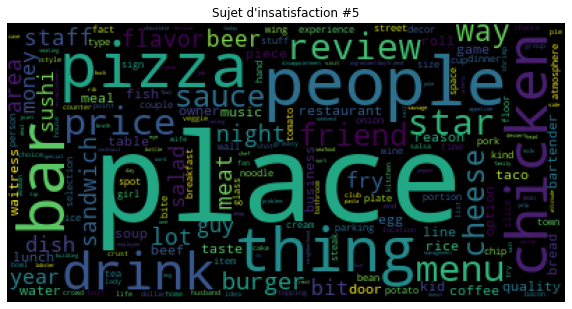

In [69]:
visualization_wordcloud(model_nmf_bow_5t)

#### Modèle NMF avec TF-IDF - 5 topics
#### Interprétation des résultats - Sujets d'insatisfaction :
- Sujet d'insatisfaction 1 : **restaurant : nourriture / service / emplacement**
- Sujet d'insatisfaction 2 : **hotel : chambres**
- Sujet d'insatisfaction 3 : **voiture : service de location voiture / voiturier**
- Sujet d'insatisfaction 4 : **réservation**
- Sujet d'insatisfaction 5 : **emplacement / bar / boisson**

#### Conclusion : 
- Le score de cohérence est bon mais légèrement inférieur au modèle LDA
- Les sujets d'insatisfaction sont identifiables et interprétables d'un point de vue métier
- On retrouve les sujets d'insatisfaction globalement similaires à ceux du modèle NMF sur représentation Bag-Of-Words

### Sélection du nombre optimal de sujets d'insatisfaction

#### Calcul des Scores de Perplexité et de Cohérence pour différents nombres de sujets d'insatisfaction

In [70]:
min_topics=3
max_topics=12

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [71]:
coherence_scores = compute_coherence_scores_nmfmodel(min_topics, max_topics, 1, tfidf_corpus, dictionary, list_neg_reviews)

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Calcul pour 3 topics :
Score de Cohérence = 0.621

Calcul pour 4 topics :
Score de Cohérence = 0.545

Calcul pour 5 topics :
Score de Cohérence = 0.615

Calcul pour 6 topics :
Score de Cohérence = 0.517

Calcul pour 7 topics :
Score de Cohérence = 0.550

Calcul pour 8 topics :
Score de Cohérence = 0.596

Calcul pour 9 topics :
Score de Cohérence = 0.543

Calcul pour 10 topics :
Score de Cohérence = 0.591

Calcul pour 11 topics :
Score de Cohérence = 0.606

Calcul pour 12 topics :
Score de Cohérence = 0.608


In [72]:
x=[int(i) for i in range(min_topics, max_topics+1)]

C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


C:\Users\olivi\anaconda3\envs\env_OC_P6_new\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


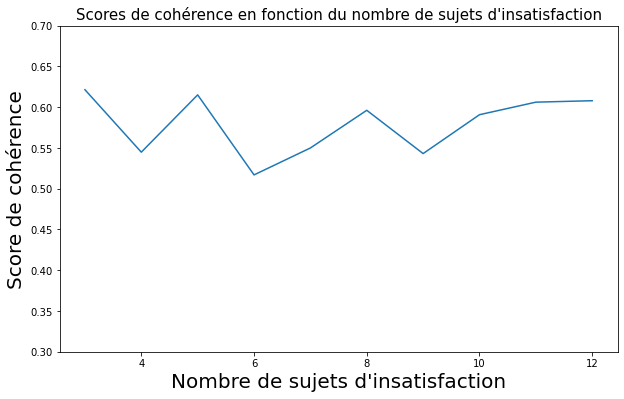

In [73]:
plt.figure(figsize=(10,6))
plt.plot(x, coherence_scores)
plt.ylim(0.3, 0.7)
plt.title("Scores de cohérence en fonction du nombre de sujets d'insatisfaction", fontsize=15)
plt.xlabel("Nombre de sujets d'insatisfaction", fontsize=20)
plt.ylabel("Score de cohérence", fontsize=20)
plt.show()

#### Conclusion :
- Il n'y a pas de valeur optimale claire
- On peut donc rester sur nos choix de paramètres 'métier' à 5 et 10 sujets d'insatisfaction

## Conclusion générale :
- Les résultats de la détection des sujets d'insatisfaction sont bons
- Les scores de cohérence sont globalement élevés (autour de 0.6), ils sont un peu meilleurs pour le modèle LDA
- Sur tous les modèles, les sujets d'insatisfaction sont globalement identifiables et interprétables d'un point de vue métier
- Le modèle LDA présente une meilleure interprétabilité d'un point de vue métier
- Le meilleur modèle est le LDA avec une représentation Bag-Of-Words et 5 ou 10 sujets d'insatisfaction
- Ce modèle donne de très bons résulats en terme d'identification et interprétabilité des sujets d'instisfaction
- On pourra montrer aux personnes du métier les résultats avec 5 et 10 topcis et ils pourront choisir ce qui leur convient le mieux
> **Cette étude montre que l'objectif fixé : détecter les différents sujets d’insatisfaction à partir de l'analyse des commentaires, est atteignable**